In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import json
import glob
import cv2
import imageio
import numpy as np

import torch
import torch.nn as nn
import torchvision
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from modules.ShapeNetHandler import ShapeNetHandler as ShapeNetSourceHandler
import matplotlib.pyplot as plt
import modules.utils

from IPython.display import Image, display

# ShapnetHandler

In [3]:
shapenet_root = "/hdd/mliuzzolino/ShapeNet/data/ShapeNetCore.v2"
shapenet_handler = ShapeNetSourceHandler(shapenet_root)

In [6]:
imagenet_labels_root = "imagenet_class_index.json"
imagenet_idx2label = modules.utils.load_imagenet_labels(imagenet_labels_root)
shapenet_handler.align_with_shapenet(imagenet_idx2label)

# Device

In [7]:
!nvidia-smi

Thu Mar 12 03:27:09 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  TITAN Xp            Off  | 00000000:05:00.0 Off |                  N/A |
| 59%   84C    P2   129W / 250W |   3392MiB / 12194MiB |     51%      Default |
+-------------------------------+----------------------+----------------------+
|   1  TITAN Xp            Off  | 00000000:09:00.0 Off |                  N/A |
| 30%   45C    P8    11W / 250W |    593MiB / 12196MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

In [8]:
GPU_ON = True
GPU_num = 1
RANDOM_SEED = 42
DEVICE = torch.device(f"cuda:{GPU_num}" if torch.cuda.is_available() and GPU_ON else 'cpu')

# Utils.set_seed(RANDOM_SEED)
print(f"Device: {DEVICE}")
print(f"Random seed: {RANDOM_SEED}")

Device: cuda:1
Random seed: 42


# Pretrained Model

In [9]:
# Source: https://pytorch.org/docs/stable/torchvision/models.html
resnet18 = models.resnet18(pretrained=True).to(DEVICE)
# inception = models.inception_v3(pretrained=True)

# Dataset Handler
- https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

In [10]:
class ShapeNetData(Dataset):
    def __init__(self, root, background_root, transforms=None):
        super().__init__()
        self.root = root
        self.background_root = background_root
        self.transforms = transforms
        
        self._setup_paths()
    
    def _get_path_info(self, path):
        class_id = path.split(os.path.sep)[-3]
        if 'synset' in class_id.lower():
            class_id = int(class_id.split("_")[1])
        instance_id = path.split(os.path.sep)[-2]
        return class_id, instance_id
    
    def _setup_paths(self):
        print(f"Building shapenet data filepaths from {self.root}...")
        self.filepaths = glob.glob(f'{self.root}/BLENDER_RENDER/*/*/*_target.png')
        print(f"Building background image filepaths from {self.background_root}...")        
        self.background_img_paths = glob.glob(f'{self.background_root}/*/*')
        print("Path setup complete.")
        
    def __len__(self):
        return len(self.filepaths)

    def _load_img(self, path):
        img = imageio.imread(path)
        return img
    
    def __getitem__(self, idx):
        # Get path
        path_i = self.filepaths[idx]
        
        # Image
        img, mask = modules.utils.read_image(path_i, parse_mask=True)
        
        # Sample background image
        background_img = modules.utils.sample_background_img(self.background_img_paths, shape=img.shape)
        
        # Add background image
        img = modules.utils.add_background(img, mask, background_img)
        
        # Labels
        class_id, instance_id = self._get_path_info(path_i)
        
        if self.transforms:
            img = self.transforms(img)
            
        return img, class_id, instance_id

In [11]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

In [12]:
# Source: https://pytorch.org/docs/stable/torchvision/models.html
# All pre-trained models expect input images normalized in the same way, 
# i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), 
# where H and W are expected to be at least 224. 
# The images have to be loaded in to a range of [0, 1] and 
# then normalized using mean = [0.485, 0.456, 0.406] and std = [0.229, 0.224, 0.225]. 
# You can use the following transform to normalize:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
fixed_normalize_transform = torchvision.transforms.Normalize(mean=mean, std=std)
fixed_unnormalize_transform = UnNormalize(mean=mean, std=std)

In [13]:
_OUTPUT_ROOT = 'render_output'
_BACKGROUND_ROOT = '/hdd/mliuzzolino/Places2/places365_standard/train'
_BATCH_SIZE = 64

In [14]:
transformations = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    fixed_normalize_transform
])

In [15]:
dataset = ShapeNetData(root=_OUTPUT_ROOT, background_root=_BACKGROUND_ROOT, transforms=transformations)
datahandler = DataLoader(dataset, batch_size=_BATCH_SIZE, shuffle=True)

Building shapenet data filepaths from render_output...
Building background image filepaths from /hdd/mliuzzolino/Places2/places365_standard/train...
Path setup complete.


### Preview Images

(-0.5, 2065.5, 2065.5, -0.5)

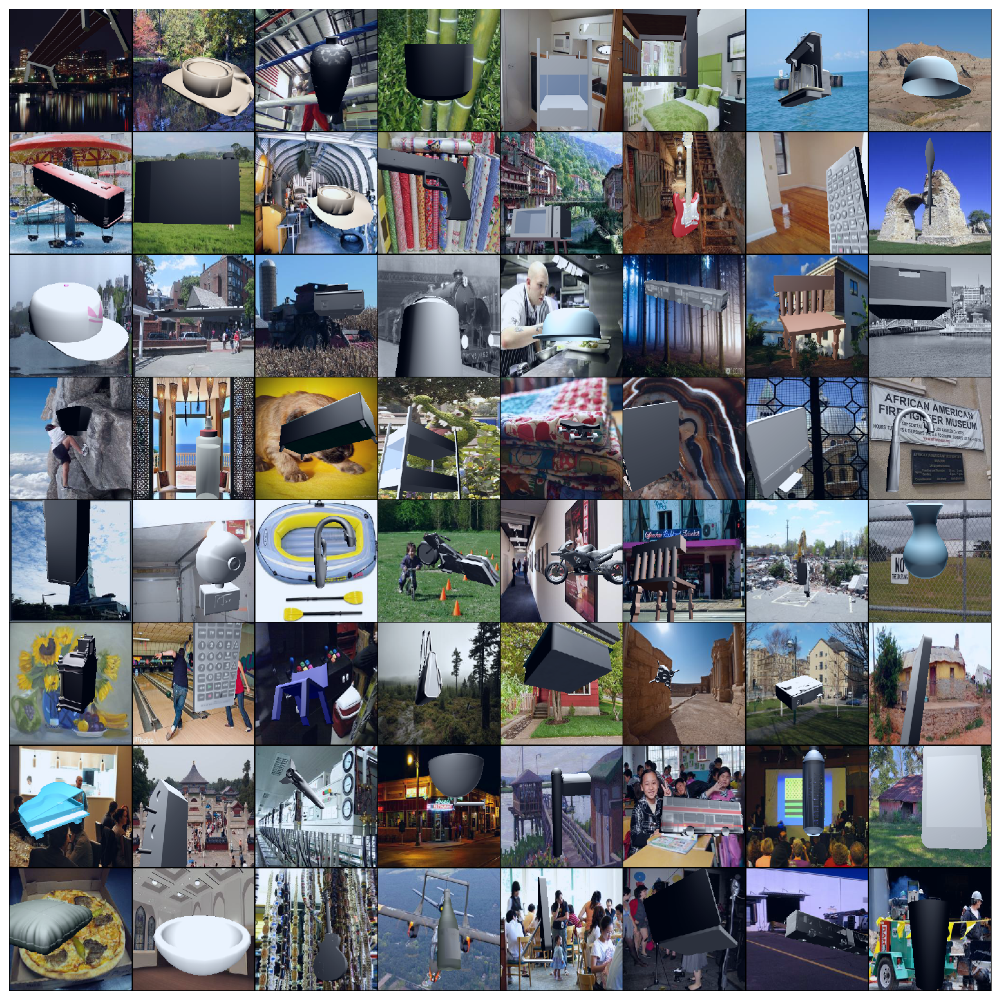

In [16]:
for i, (imgs, class_ids, instance_ids) in enumerate(datahandler):
    break
grid_imgs = torchvision.utils.make_grid(imgs, normalize=True).permute(1,2,0)
plt.figure(figsize=(14,14))
plt.imshow(grid_imgs)
plt.axis('off')

# Evaluate

In [17]:
get_prediction_idxs = lambda out : torch.argmax(nn.Softmax(dim=1)(out), dim=1)

In [40]:
EVAL_BATCH_LIMIT = 10
BAD_MATCH_LABEL = len(imagenet_idx2label)+1

In [48]:
num_evaluated = 0
all_imgs = []
all_predictions = []
try:
    for i, (imgs, class_ids, instance_ids) in enumerate(datahandler):
        if i > EVAL_BATCH_LIMIT:
            break
        sys.stdout.write(f"\rEvaluating {i+1}/{len(datahandler)}...")
        sys.stdout.flush()

        # Setup labels
        shapenet_names = [shapenet_handler.lookup_name(class_id.item()) for class_id in class_ids]
        actual_labels = np.array([ele[1] for ele in shapenet_names])
        bad_idxs = np.array([i for i, ele in enumerate(actual_labels) if ele is None])
        if len(bad_idxs) > 0:
            actual_labels[bad_idxs] = BAD_MATCH_LABEL
        actual_labels = actual_labels.astype(np.int)
        
        # Send to device
        imgs = imgs.to(DEVICE)

        # Inference
        output = resnet18(imgs)
        predicted_labels = get_prediction_idxs(output).cpu()
        predicted_names = [imagenet_idx2label[pred_idx] for pred_idx in predicted_labels]

        num_correct = (predicted_labels == torch.tensor(actual_labels)).sum()
        num_evaluated += predicted_labels.shape[0]


        if i == 0:
            all_imgs = imgs
            all_predicted_labels = predicted_names
        else:
            all_imgs = torch.cat([all_imgs, imgs], dim=0)
            all_predicted_labels += predicted_names
except KeyboardInterrupt:
    print("\nEnding Early")

Evaluating 11/232...

In [50]:
accuracy = (num_correct / float(num_evaluated)).item()
print("accuracy: ", accuracy)

accuracy:  0.0028409091755747795


# Visualize

In [51]:
_VIS_LIMIT = 100
random_idxs = np.random.choice(range(all_imgs.shape[0]), _VIS_LIMIT, replace=False)
for i, idx in enumerate(random_idxs):
    img = all_imgs[idx]
    label = all_predicted_labels[idx]
    if i > _VIS_LIMIT:
        break
    img = (fixed_unnormalize_transform(img.clone()) * 255).byte()
    img_np = img.permute(1,2,0).cpu().numpy()
    annotated_im = modules.utils.add_labels_to_img(img_np, label, fontsize=1, x=0, y=50, text_color=[255,0,0])
    annotated_im = annotated_im[np.newaxis,...]
    if i == 0:
        all_annotated_images = annotated_im
    else:
        all_annotated_images = np.concatenate([all_annotated_images, annotated_im], axis=0)

In [52]:
all_annotated_images_pt = torch.tensor(all_annotated_images).permute(0,3,1,2)
all_annotated_grid = torchvision.utils.make_grid(all_annotated_images_pt, nrow=10).permute(1,2,0)

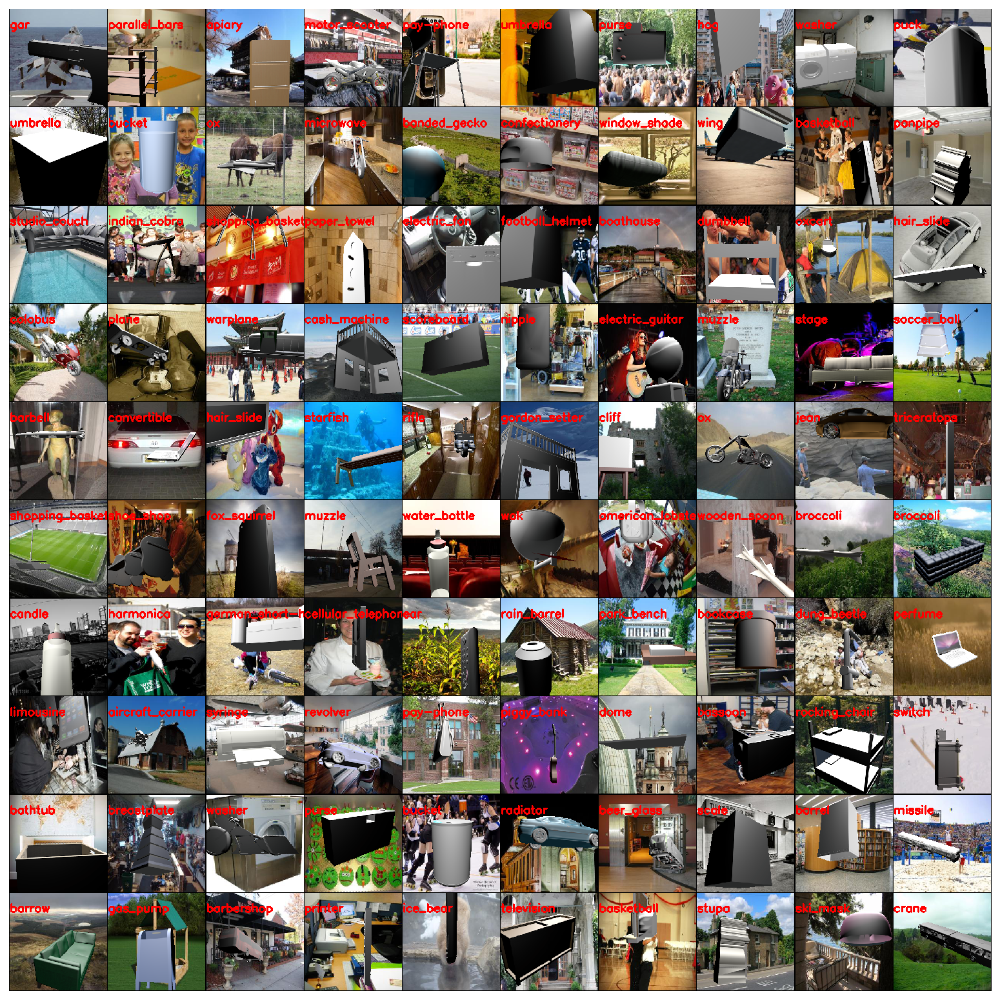

In [54]:
plt.figure(figsize=(14,14))
plt.imshow(all_annotated_grid)
plt.axis('off')
plt.savefig('Resnet18_examples.png', dpi=250)